# ato-recalc-exploration

[Methodology](https://docs.google.com/presentation/d/1_ebXhoCxja-yiWcL9MKC-lt5kn7s6wUvVVDDeaQMPQs/edit#slide=id.g2f8d827a3a1_0_243)

In [247]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import folium
from IPython.display import display, Markdown

# show all columns
pd.options.display.max_columns = None

# Select YEARS, VERSIONS, and VARIABLES

In [248]:
forecast_years = {
                    0:'OY2023',
                    1:'RTP2050',
                 }   

ato_versions = {
                0:'RTP23',
                1:'New', # 40 min
                2:'New_Add5Min',
                3:'New_Add10Min',
                4:'New_Sub5Min',
               }

variables = {
                0:'ATO_Job_byAuto',
                1:'ATO_Job_byAuto_FF', # free flow
                2:'ATO_Job_byAuto_SL', # straight line
                3:'ATO_Job_byWalk',
                4:'ATO_Job_byBike',
                5:'ATO_Job_byTran_wk', # walk
                6:'ATO_Job_byTran_dr', # drive
                7:'ATO_HH_byAuto',
                8:'ATO_HH_byAuto_FF',
                9:'ATO_HH_byAuto_SL',
                10:'ATO_HH_byWalk',
                11:'ATO_HH_byBike',
                12:'ATO_HH_byTran_wk',
                13:'ATO_HH_byTran_dr',
            }

change_modes = {
                0:'difference', 
                1:'percent_difference',
            }

normalization_modes = {
    0: 'none',
    1: 'sum_job',
    2: 'sum_hh',
    3: 'sum_ato',
    4: 'max_ato',
}

geography = {
    0: 'wfrcmag',
    1: 'weber',
    2: 'davis',
    3: 'salt_lake',
    4: 'utah',
}

#===========================================
# select year, version, change mode, export
#===========================================

# ato dataset #1
year_1 = 0
version_1 = 1
variable_1 = 0

# ato dataset #2
year_2 = 0
version_2 = 4
variable_2 = 0

# normalization mode
normalization_mode = 0

# change mode
change_mode = 0

# geography
geography = 4

# export data layers?
export = False

In [249]:
display(Markdown(f"# Comparing {variables[variable_1]} ({ato_versions[version_1]}) from {forecast_years[year_1]} to... \
                 {variables[variable_2]} ({ato_versions[version_2]}) from {forecast_years[year_2]}"))

# Comparing ATO_Job_byAuto (New) from OY2023 to...                  ATO_Job_byAuto (New_Sub5Min) from OY2023

In [250]:
# set output directory
outputs = '.\\Outputs'
if not os.path.exists(outputs[0]):
    os.makedirs(outputs[0])

In [251]:
# fill NA values in geodataframes (ignores SHAPE column)
def fill_na_gdf(df_with_shape_column, fill_value=0):
    if 'geometry' in list(df_with_shape_column.columns):
        df = df_with_shape_column.copy()
        shape_column = df['geometry'].copy()
        del df['geometry']
        return df.fillna(fill_value).merge(shape_column,left_index=True, right_index=True, how='inner')
    else:
        raise Exception("Dataframe does not include 'geometry' column")

In [252]:
# Data prep
taz_sdf = gpd.read_file(r".\Inputs\TAZ.shp")
taz_sdf = taz_sdf[taz_sdf['DISTSML'].isin([1, 2, 6, 7, 20, 21, 34, 59, 60, 79, 80, 81 , 115, 116, 117, 118, 119, 120, 121, 122, 128, 129, 123, 124, 125, 126, 127])==False].copy()

if geography == 0:
    taz_sdf = taz_sdf[taz_sdf['CO_FIPS'].isin([3,11,35,49,57])==True]
elif geography == 1:
    taz_sdf = taz_sdf[taz_sdf['CO_FIPS'].isin([57])==True]
elif geography == 2:
    taz_sdf = taz_sdf[taz_sdf['CO_FIPS'].isin([11])==True]
elif geography == 3:
    taz_sdf = taz_sdf[taz_sdf['CO_FIPS'].isin([35])==True]
elif geography == 4:
    taz_sdf = taz_sdf[taz_sdf['CO_FIPS'].isin([49])==True]


ato_1 = pd.read_csv(f"./Inputs/ATO_{forecast_years[year_1]}_{ato_versions[version_1]}.csv")
taz_ato_1 = taz_sdf[['CO_TAZID', 'CO_FIPS',	'CO_NAME', 'CITY_NAME', 'geometry']].merge(ato_1, on='CO_TAZID', how='inner')

ato_2 = pd.read_csv(f"./Inputs/ATO_{forecast_years[year_2]}_{ato_versions[version_2]}.csv")
taz_ato_2 = taz_sdf[['CO_TAZID', 'CO_FIPS',	'CO_NAME', 'CITY_NAME', 'geometry']].merge(ato_2, on='CO_TAZID', how='inner')

# taz_sdf.columns

In [253]:
if normalization_mode == 0:

    # regional sum of Jobs
    ato_1 = variables[variable_1]
    job_sum_region = taz_ato_1['Job'].sum()
    taz_ato_1['SUM_JOB'] = job_sum_region

    # ATO / regional sum of Jobs
    ato_1_normalized = ato_1 + '_SUM_JOB'
    taz_ato_1[ato_1_normalized] = taz_ato_1[ato_1] / taz_ato_1['SUM_JOB']


    # ato_1_sum_job_by_county = taz_ato_1.groupby('CO_FIPS', as_index=False)[ato_1_sum_job].sum()

    # regional sum of Jobs
    ato_2 = variables[variable_2]
    job_sum_region = taz_ato_2['Job'].sum()
    taz_ato_2['SUM_JOB'] = job_sum_region

    # ATO / regional sum of Jobs
    ato_2_normalized = ato_2 + '_SUM_JOB'
    taz_ato_2[ato_2_normalized] = taz_ato_2[ato_2] / taz_ato_2['SUM_JOB']
    # ato_2_sum_job_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_sum_job].sum()

################

elif normalization_mode == 1:

    # regional sum of HH
    ato_1 = variables[variable_1]
    hh_sum_region = taz_ato_1['HH'].sum()
    taz_ato_1['SUM_HH'] = hh_sum_region

    # ATO / regional sum of hh
    ato_1_normalized = ato_1 + '_SUM_HH'
    taz_ato_1[ato_1_normalized] = taz_ato_1[ato_1] / taz_ato_1['SUM_HH']
    # ato_1_sum_hh_by_county = taz_ato_1.groupby('CO_FIPS', as_index=False)[ato_1_sum_hh].sum()

    # regional sum of HH
    ato_2 = variables[variable_2]
    hh_sum_region = taz_ato_2['HH'].sum()
    taz_ato_2['SUM_HH'] = hh_sum_region

    # ATO / regional sum of hh
    ato_2_normalized = ato_2 + '_SUM_HH'
    taz_ato_2[ato_2_normalized] = taz_ato_2[ato_2] / taz_ato_2['SUM_HH']
    # ato_2_sum_hh_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_sum_hh].sum()   

################

elif normalization_mode == 2:

    # regional sum of ATO
    ato_1 = variables[variable_1]
    ato_sum_region = taz_ato_1[ato_1].sum()
    taz_ato_1[ato_1 + '_SUM_ATO'] = ato_sum_region

    # ATO / regional sum of ATO
    ato_1_normalized = ato_1 + '_SUM_ATO'
    taz_ato_1[ato_1_normalized] = taz_ato_1[ato_1] / taz_ato_1[ato_1 + '_SUM_ATO']
    # ato_1_sum_ato_by_county = taz_ato_1.groupby('CO_FIPS', as_index=False)[ato_1_sum_ato].sum()

    # regional sum of ATO
    ato_2 = variables[variable_2]
    ato_sum_region = taz_ato_2[ato_2].sum()
    taz_ato_2[ato_2 + '_SUM_ATO'] = ato_sum_region

    # ATO / regional sum of ATO
    ato_2_normalized = ato_2 + '_SUM_ATO'
    taz_ato_2[ato_2_normalized] = taz_ato_2[ato_2] / taz_ato_2[ato_2 + '_SUM_ATO']
    # ato_2_sum_ato_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_sum_ato].sum()

################

elif normalization_mode == 3:

    # regional max of ato
    ato_1 = variables[variable_1]
    ato_max_region = taz_ato_1[ato_1].max()
    taz_ato_1[ato_1 + '_MAX_ATO'] = ato_max_region

    # ATO / Regional Max of ATO
    ato_1_normalized = ato_1 + '_MAX_ATO'
    taz_ato_1[ato_1_normalized] = taz_ato_1[ato_1] / taz_ato_1[ato_1 + '_MAX_ATO']
    # ato_1_max_ato_by_county = taz_ato_1.groupby('CO_FIPS', as_index=False)[ato_1_max_ato].sum()

    # regional max of ato
    ato_2 = variables[variable_2]
    ato_max_region = taz_ato_2[ato_2].max()
    taz_ato_2[ato_2 + '_MAX_ATO'] = ato_max_region

    # ATO / Regional Max of ATO
    ato_2_normalized = ato_2 + '_MAX_ATO'
    taz_ato_2[ato_2_normalized] = taz_ato_2[ato_2] / taz_ato_2[ato_2 + '_MAX_ATO']
    # ato_2_max_ato_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_max_ato].sum()


################

# by_county_1 = (ato_1_sum_job_by_county.merge(ato_1_sum_hh_by_county, on='CO_FIPS', how='left')
#                                     .merge(ato_1_sum_ato_by_county, on='CO_FIPS', how='left')
#                                     .merge(ato_1_max_ato_by_county, on='CO_FIPS', how='left')
#                                     .set_index('CO_FIPS'))
# by_county_1

In [254]:
# # regional sum of Jobs
# ato_2 = variables[variable_2]
# job_sum_region = taz_ato_2['Job'].sum()
# taz_ato_2['SUM_JOB'] = job_sum_region

# # ATO / regional sum of Jobs
# ato_2_sum_job = ato_2 + '_PER_SUM_JOB'
# taz_ato_2[ato_2_sum_job] = taz_ato_2[ato_2] / taz_ato_2['SUM_JOB']
# ato_2_sum_job_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_sum_job].sum()

# ################

# # regional sum of HH
# ato_2 = variables[variable_2]
# hh_sum_region = taz_ato_2['HH'].sum()
# taz_ato_2['SUM_HH'] = hh_sum_region

# # ATO / regional sum of hh
# ato_2_sum_hh = ato_2 + '_BY_SUM_HH'
# taz_ato_2[ato_2_sum_hh] = taz_ato_2[ato_2] / taz_ato_2['SUM_HH']
# ato_2_sum_hh_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_sum_hh].sum()

# ################

# # regional sum of ATO
# ato_2 = variables[variable_2]
# ato_sum_region = taz_ato_2[ato_2].sum()
# taz_ato_2[ato_2 + '_SUM_ATO'] = ato_sum_region

# # ATO / regional sum of ATO
# ato_2_sum_ato = ato_2 + '_BY_SUM_ATO'
# taz_ato_2[ato_2_sum_ato] = taz_ato_2[ato_2] / taz_ato_2[ato_2 + '_SUM_ATO']
# ato_2_sum_ato_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_sum_ato].sum()

# ################

# # regional max of ato
# ato_2 = variables[variable_2]
# ato_max_region = taz_ato_2[ato_2].max()
# taz_ato_2[ato_2 + '_MAX_ATO'] = ato_max_region

# # ATO / Regional Max of ATO
# ato_2_max_ato = ato_2 + '_BY_MAX_ATO'
# taz_ato_2[ato_2_max_ato] = taz_ato_2[ato_2] / taz_ato_2[ato_2 + '_MAX_ATO']
# ato_2_max_ato_by_county = taz_ato_2.groupby('CO_FIPS', as_index=False)[ato_2_max_ato].sum()


# ################

# by_county_2 = (ato_2_sum_job_by_county.merge(ato_2_sum_hh_by_county, on='CO_FIPS', how='left')
#                                       .merge(ato_2_sum_ato_by_county, on='CO_FIPS', how='left')
#                                       .merge(ato_2_max_ato_by_county, on='CO_FIPS', how='left')
#                                       .set_index('CO_FIPS'))
# by_county_2

# Tabulated change of normalized ATO by County

In [255]:
# by_county_2 - by_county_1


# Interactive Mapping
[Explore](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explore.html)  
[Colormaps](https://matplotlib.org/stable/users/explain/colors/colormaps.html)  
[Tiles](https://python-visualization.github.io/folium/latest/user_guide/raster_layers/tiles.html)

In [256]:
display(Markdown(f"## ATO Variable #1: {variables[variable_1]} ({ato_versions[version_1]}) from {forecast_years[year_1]}"))

## ATO Variable #1: ATO_Job_byAuto (New) from OY2023

<Axes: >

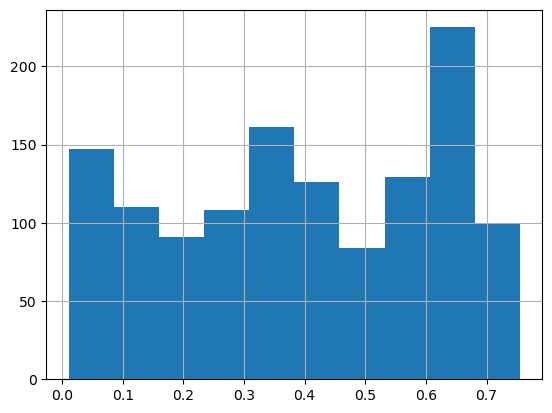

In [257]:
taz_ato_1[ato_1_normalized].hist()

In [258]:
taz_ato_1.explore(
    column=ato_1_normalized,  # make choropleth based on "BoroName" column
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    k=10,  # use 10 bins
    tooltip=False,  # show "BoroName" value in tooltip (on hover)
    popup=True,  # show all values in popup (on click)
    tiles="OpenStreetMap",  # use "CartoDB positron" tiles
    cmap="magma",  # use matplotlib colormap
    style_kwds=dict(color="black", fillOpacity=.9,),  # use black outline, set layer opacity
    name=ato_1_normalized,  # name of the layer in the map
)

In [259]:
display(Markdown(f"# ATO Variable #2: {variables[variable_2]} ({ato_versions[version_2]}) from {forecast_years[year_2]}"))

# ATO Variable #2: ATO_Job_byAuto (New_Sub5Min) from OY2023

<Axes: >

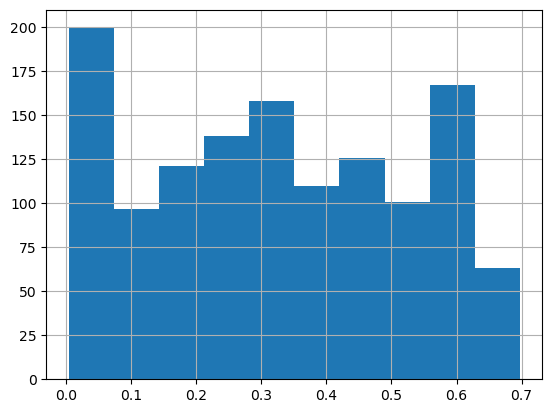

In [260]:
taz_ato_2[ato_2_normalized].hist()

In [261]:
taz_ato_2.explore(
    column=ato_2_normalized,  # make choropleth based on "BoroName" column
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    k=10,  # use 10 bins
    tooltip=False,  # show "BoroName" value in tooltip (on hover)
    popup=True,  # show all values in popup (on click)
    tiles="OpenStreetMap",  # use "CartoDB positron" tiles
    cmap="magma",  # use matplotlib colormap
    style_kwds=dict(color="black", fillOpacity=.9,),  # use black outline, set layer opacity
    name=ato_2_normalized,  # name of the layer in the map

)

# View Change in the Interactive Map

In [262]:
print(f'Change mode: {change_modes[change_mode]}')

Change mode: difference


In [263]:
# red = more access than before, blue = less access

# calculate difference
if change_mode == 0:
    change = (taz_ato_2[ato_2_normalized] - taz_ato_1[ato_1_normalized])
if change_mode == 1:
    change = ((taz_ato_2[ato_2_normalized] - taz_ato_1[ato_1_normalized]) / taz_ato_1[ato_1_normalized])

# fill no data
change = change.fillna(0)

# rename the series using dict
change = change.rename(change_modes[change_mode])

# merge back to taz geometry
change = taz_ato_1[['CO_TAZID', 'CO_FIPS','CO_NAME', 'CITY_NAME','HH',  'geometry']].merge(change, left_index=True,right_index=True,  how='inner')

change.explore(
    column= change_modes[change_mode],  # make choropleth based on "BoroName" column
    scheme="naturalbreaks",  # use mapclassify's natural breaks scheme
    legend=True,  # show legend
    k=10,  # use 10 bins
    tooltip=False,  # show "BoroName" value in tooltip (on hover)
    popup=True,  # show all values in popup (on click)
    tiles="OpenStreetMap",  # use "CartoDB positron" tiles
    cmap="RdYlBu",  # use matplotlib colormap
    style_kwds=dict(color="black", fillOpacity=.8,),  # use black outline, set layer opacity
    name=change_modes[change_mode],  # name of the layer in the map
    # width='50%',
)

# Export Features

In [264]:
if export == True:
    taz_ato_1.to_file(location=os.path.join(outputs, f'ATO_{forecast_years[year_1]}_{ato_versions[version_1]}.shp'))
    taz_ato_2.to_file(location=os.path.join(outputs, f'ATO_{forecast_years[year_2]}_{ato_versions[version_2]}.shp'))
    change.to_file(location=os.path.join(outputs, f'ATO_{forecast_years[year_2]}_{ato_versions[version_2]}_{forecast_years[year_1]}_{ato_versions[version_1]}_{change_modes[change_mode]}.shp')) 

In [265]:
# Actualized

# ## Currently uses HH for regional sum but should have the ability to switch to jobs if variable is HH-related

# # regional sum of HH
# hh_sum_region = taz_ato_1['HH'].sum()
# taz_ato_1['HH_SUM_REGION'] = hh_sum_region

# # percent of regional households by TAZ
# taz_ato_1['HH_RATIO_REGION'] = taz_ato_1['HH'] / taz_ato_1['HH_SUM_REGION']

# # variable weighted by the TAZ's percentage of HH
# taz_ato_1[variables[variable_1] + '_AVG_HH'] = taz_ato_1[variables[variable_1]] * taz_ato_1['HH_RATIO_REGION']

# # regional sum of the newly weighted variable
# taz_ato_1_var1_sum_region = (taz_ato_1[variables[variable_1] + '_AVG_HH'].sum()).round()
# print(f'Sum of {variables[variable_1]} (weighted by households): ', taz_ato_1_var1_sum_region)

# # ratio of variable divided by weighted regional sum of variable
# taz_ato_1[variables[variable_1] + '_PER_REG_ACC'] = taz_ato_1[variables[variable_1]] / taz_ato_1_var1_sum_region